# Amazon Sales Data Analysis

### Importing Required Libraries:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

### Importing the dataset:

In [2]:
sales = pd.read_excel(r'D:\Github\Amazon Sales Data Analysis\Raw Data\SALESDATA.xls', parse_dates=['DateKey','Invoice Date', 'Promised Delivery Date'])

In [3]:
sales.head()

,CustKey,DateKey,Discount Amount,Invoice Date,Invoice Number,Item Class,Item Number,Item,Line Number,List Price,Order Number,Promised Delivery Date,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep,U/M
0,10000481,2017-04-30,-237.91,2017-04-30,100012,NaN,NaN,Urban Large Eggs,2000,0.00,200015,2017-04-30,237.91,0.00,0.0,237.91,237.910000,1,184,EA
1,10002220,2017-07-14,368.79,2017-07-14,100233,P01,20910,Moms Sliced Turkey,1000,824.96,200245,2017-07-14,456.17,824.96,0.0,456.17,456.170000,1,127,EA
2,10002220,2017-10-17,109.73,2017-10-17,116165,P01,38076,Cutting Edge Foot-Long Hot Dogs,1000,548.66,213157,2017-10-16,438.93,548.66,0.0,438.93,438.930000,1,127,EA
3,10002489,2017-06-03,-211.75,2017-06-03,100096,NaN,NaN,Kiwi Lox,1000,0.00,200107,2017-06-03,211.75,0.00,0.0,211.75,211.750000,1,160,EA
4,10004516,2017-05-27,96627.94,2017-05-27,103341,P01,60776,High Top Sweet Onion,1000,408.52,203785,2017-05-28,89248.66,185876.60,0.0,89248.66,196.150901,455,124,SE


In [4]:
sales.shape

(65282, 20)

In [5]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65282 entries, 0 to 65281
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype         
---  ------                            --------------  -----         
 0   CustKey                           65282 non-null  int64         
 1   DateKey                           65282 non-null  datetime64[ns]
 2   Discount Amount                   65280 non-null  float64       
 3   Invoice Date                      65282 non-null  datetime64[ns]
 4   Invoice Number                    65282 non-null  int64         
 5   Item Class                        56993 non-null  object        
 6   Item Number                       65241 non-null  object        
 7   Item                              65282 non-null  object        
 8   Line Number                       65282 non-null  int64         
 9   List Price                        65282 non-null  float64       
 10  Order Number                      65282 non-nu

In [6]:
# Checking Null Values
sales.isnull().sum()

CustKey                                0
DateKey                                0
Discount Amount                        2
Invoice Date                           0
Invoice Number                         0
Item Class                          8289
Item Number                           41
Item                                   0
Line Number                            0
List Price                             0
Order Number                           0
Promised Delivery Date                 0
Sales Amount                           0
Sales Amount Based on List Price       0
Sales Cost Amount                      0
Sales Margin Amount                    0
Sales Price                            1
Sales Quantity                         0
Sales Rep                              0
U/M                                    0
dtype: int64

In [7]:
# Removing Null Values
sales.dropna(inplace=True)

In [8]:
sales.isnull().sum()

CustKey                             0
DateKey                             0
Discount Amount                     0
Invoice Date                        0
Invoice Number                      0
Item Class                          0
Item Number                         0
Item                                0
Line Number                         0
List Price                          0
Order Number                        0
Promised Delivery Date              0
Sales Amount                        0
Sales Amount Based on List Price    0
Sales Cost Amount                   0
Sales Margin Amount                 0
Sales Price                         0
Sales Quantity                      0
Sales Rep                           0
U/M                                 0
dtype: int64

In [9]:
# Descriptive statistics
sales.describe()

,CustKey,Discount Amount,Invoice Number,Line Number,List Price,Order Number,Sales Amount,Sales Amount Based on List Price,Sales Cost Amount,Sales Margin Amount,Sales Price,Sales Quantity,Sales Rep
count,5.699300e+04,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.000000,56993.00000
mean,1.001758e+07,1526.396318,216407.511537,24588.751777,536.262010,180463.928675,1655.777031,3182.173348,925.933614,729.843417,290.313444,9.841472,136.69312
std,7.231012e+03,5327.696464,95002.543962,32477.174741,446.072796,67594.415280,5309.497134,10546.977037,3169.623938,2328.875603,244.347560,34.132815,26.47562
min,1.000045e+07,-15030.790000,100034.000000,1000.000000,0.000000,100838.000000,200.010000,0.000000,0.000000,-717.590000,1.282816,1.000000,103.00000
25%,1.001242e+07,255.950000,117962.000000,4000.000000,190.850000,115223.000000,301.460000,561.040000,162.890000,128.520000,102.403333,2.000000,113.00000
50%,1.001940e+07,455.900000,222954.000000,13000.000000,378.290000,203670.000000,533.640000,983.440000,295.240000,237.940000,202.910000,3.000000,130.00000
75%,1.002351e+07,1006.424400,314275.000000,33000.000000,824.962500,218640.000000,1170.680000,2169.220000,626.900000,524.720000,463.920000,6.000000,160.00000
max,1.002758e+07,191196.553200,332842.000000,330000.000000,1975.000000,321532.000000,215364.600000,391924.723200,118903.530000,96461.070000,1474.170000,1000.000000,185.00000


<AxesSubplot:>

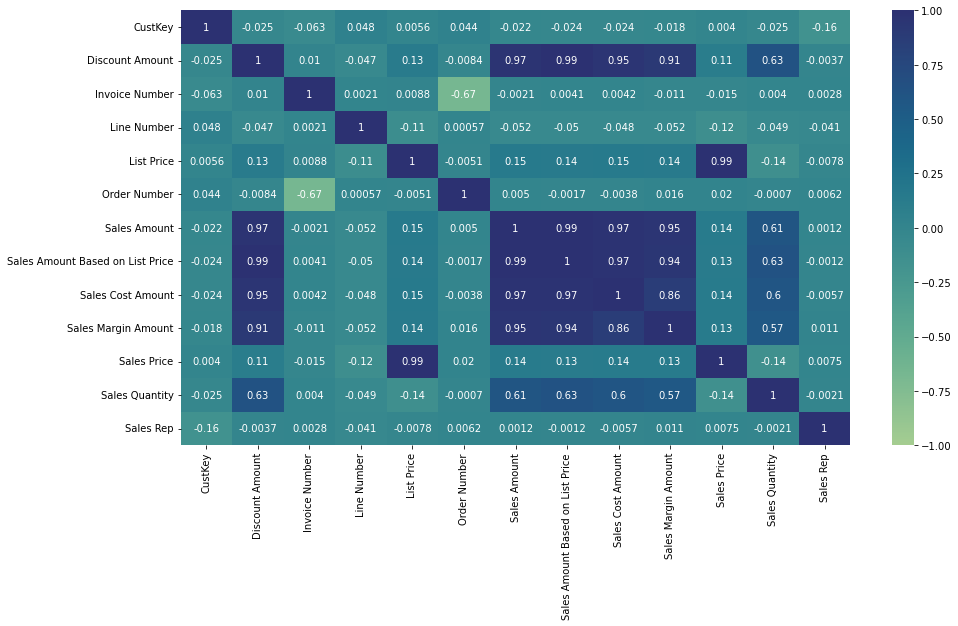

In [10]:
# Checking the correlation
plt.figure(figsize=(15,8))
sns.heatmap(sales.corr(method='pearson'), annot=True, vmin=-1, vmax=1, cmap='crest')

Observations:
- Discount Amount is highly related to Sales Amount, Sales Cost Amount, Sales Amount Based on List Price & Sales Margin Amount and moderately related to Sales Quantity.
- List Price highly related to sales price and has no relations with Sales amount, Sales cost amount, Sales amount based on list price & sales margin amount.
- Sales quantity is moderately related to Sales amount, discount amount, sales margin amount.
- Their is no relation between Sales Rep and Sales Amount, Sales Margin Amount.

In [11]:
sales.columns

Index(['CustKey', 'DateKey', 'Discount Amount', 'Invoice Date',
       'Invoice Number', 'Item Class', 'Item Number', 'Item', 'Line Number',
       'List Price', 'Order Number', 'Promised Delivery Date', 'Sales Amount',
       'Sales Amount Based on List Price', 'Sales Cost Amount',
       'Sales Margin Amount', 'Sales Price', 'Sales Quantity', 'Sales Rep',
       'U/M'],
      dtype='object')

In [12]:
sales.Item.value_counts()

Better Fancy Canned Sardines    1609
Ebony Prepared Salad            1370
Moms Sliced Turkey              1192
Imagine Popsicles               1191
Discover Manicotti              1126
                                ... 
Nationeel BBQ Potato Chips         1
Best Choice Sesame Crackers        1
Ebony Mixed Nuts                   1
Imagine Grape Popsicles            1
Just Right Rice Soup               1
Name: Item, Length: 479, dtype: int64

In [13]:
item_names = sales.Item.value_counts().index

In [14]:
item_val = sales.Item.value_counts().values

<AxesSubplot:>

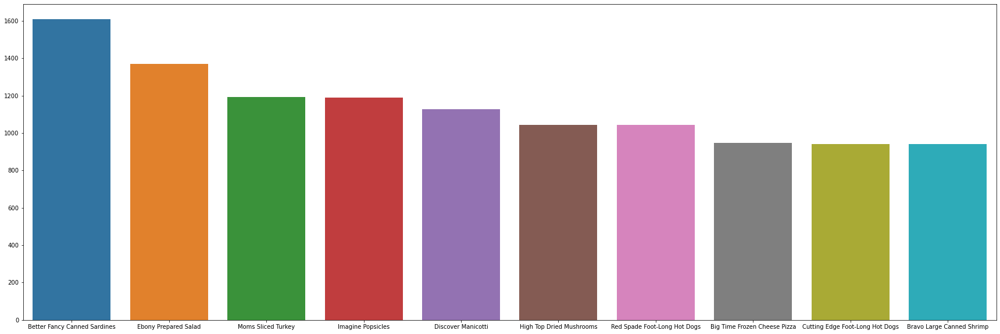

In [17]:
# Top 10 selling items
import matplotlib
matplotlib.rcParams['figure.figsize'] = (30, 10)
sns.barplot(x=item_names[:10], y=item_val[:10])

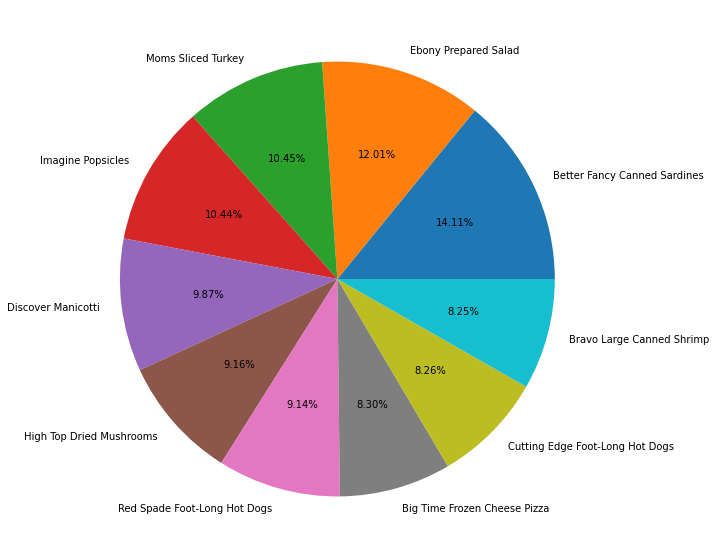

In [18]:
# Pie Chart showing percentage of top selling items
plt.pie(item_val[:10], labels=item_names[:10], autopct='%1.2f%%', radius = 1)
plt.show()

## Automated EDA

In [22]:
from pandas_profiling import ProfileReport

In [24]:
from pandas_profiling.profile_report import ProfileReport

In [25]:
profile = ProfileReport(sales,explorative=True)

In [26]:
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]